# 0 Loading packages <a name="loading"></a> 

In [13]:
import sys
print(sys.executable)
print(sys.path)
print(sys.version)

/home2/s418610/.conda/envs/py37_res_PAGA/bin/python
['/home2/s418610/jupyter_notebooks/03.Invivo_neuronal_reprogramming/Manuscript/to_GitHub/Adult_neurogenesis', '', '/cm/shared/apps/cnvkit/0.9.5/lib/python3.6/site-packages', '/cm/shared/apps/python/3.6.4-anaconda/lib', '/cm/shared/apps/jupyterkernel-matlab/0.16.1/lib/python3.6/site-packages', '/cm/shared/apps/python/2.7.x-anaconda/lib', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python37.zip', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/lib-dynload', '/home2/s418610/.local/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/fa2-0.3.5-py3.7-linux-x86_64.egg', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/IPython/extensions', '/home2/s418610/.ipython']
3.7.3 (default, Mar 27 2019, 22:11:17) 
[GCC 7.3.0]


In [14]:
import re
from pathlib import Path
import numpy as np
import pandas as pd
import scipy.sparse
import sklearn.manifold
import statsmodels.api as sm

# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from pyclustering.cluster.kmedoids import kmedoids

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
# import seaborn as sb

import scanpy as sc
import harmonypy as hm

In [15]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
# plt.rcParams["axes.grid"] = False
sc.settings.verbosity = 3

# sc.set_figure_params(figsize=(8,8), fontsize=12)

print('numpy', np.__version__)
print('pandas', pd.__version__)
print('scipy', scipy.__version__)
print('sklearn', sklearn.__version__)
print('statsmodels', sm.__version__)
print('matplotlib', mpl.__version__)
print('seaborn', sns.__version__)

sc.logging.print_versions() # scanpy==1.4.5.post1, anndata==0.6.22.post1

!date +%F

numpy 1.17.2
pandas 0.25.2
scipy 1.3.1
sklearn 0.21.3
statsmodels 0.10.1
matplotlib 3.3.2
seaborn 0.9.0
scanpy==1.4.5.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1
2021-08-19


In [16]:
import os

# set a working directory for saving plots
wdir = "/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_revision/"
os.chdir( wdir )

In [17]:
# A sub-directory for saving intermediate data for organized pipeline v1
data_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/Cluster_with_10X_20k/data/10x_remapped/Revision/'

In [18]:
neural_data_dir = data_dir + 'NeuralOnly/'

# 1 Load and label data

## Load post doublet removal, post filtering reprogramming data

In [8]:
adata_repr = sc.read(data_dir + 'BL41-42_10X-samples11_51_postFiltering.h5ad')

In [9]:
adata_repr

AnnData object with n_obs × n_vars = 30331 × 18523 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'library_name_colors'

In [13]:
adata_repr = adata_repr[adata_repr.obs['batch']=='experiment']

## Load post doublet removal, post filtering adult neurogenesis data

In [14]:
adata_neur = sc.read(neural_data_dir + 'Hochgerner_postFiltering.h5ad')

In [15]:
adata_neur

AnnData object with n_obs × n_vars = 23831 × 17611 
    obs: 'source name', 'organism', 'characteristics: strain', 'characteristics: age', 'characteristics: sex of pooled animals', 'characteristics: cell cluster', 'molecule', 'SRR run accession', 'raw file (original file name)', 'UMI_CellularBarcode', 'library_name', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac'
    var: 'n_cells'
    uns: 'library_name_colors'

## Take gene intersection

In [17]:
genes_overlap = np.intersect1d(adata_repr.var_names, adata_neur.var_names)

In [18]:
len(genes_overlap)

16246

In [20]:
adata_combined = adata_repr.concatenate(adata_neur, join='inner', batch_key='dataset', 
                                        batch_categories=['reprogramming', 'neurogenesis'], 
                                        index_unique=None)

In [21]:
adata_combined

AnnData object with n_obs × n_vars = 34198 × 16246 
    obs: 'SRR run accession', 'UMI_CellularBarcode', 'batch', 'characteristics: age', 'characteristics: cell cluster', 'characteristics: sex of pooled animals', 'characteristics: strain', 'dataset', 'doublet_scores', 'lenti_count', 'lenti_log1p_count', 'library_name', 'log_counts', 'molecule', 'mt_count', 'mt_frac', 'n_counts', 'n_genes', 'organism', 'predicted_doublets', 'raw file (original file name)', 'source name', 'tdT_count', 'tdT_log1p_count'
    var: 'gene_ids-reprogramming', 'feature_types-reprogramming', 'genome-reprogramming', 'n_cells-reprogramming', 'n_cells-neurogenesis'

In [25]:
#Keep the count data in a counts layer
adata_combined.layers['counts'] = adata_combined.X.copy()

In [26]:
# Natural log-transform the data
sc.pp.log1p(adata_combined)

In [27]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata_combined.raw = adata_combined

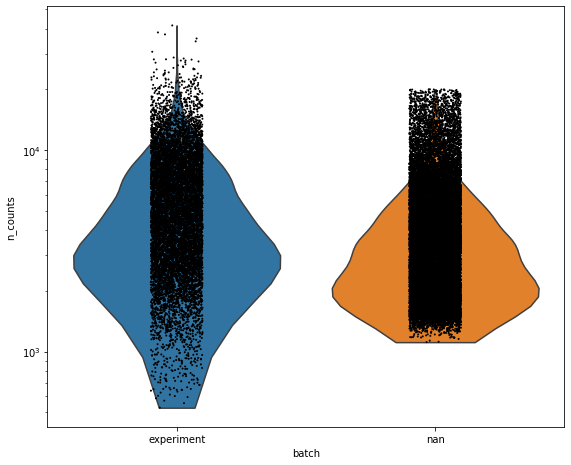

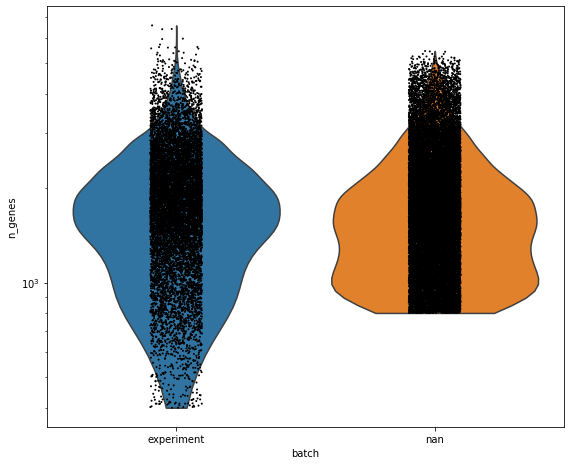

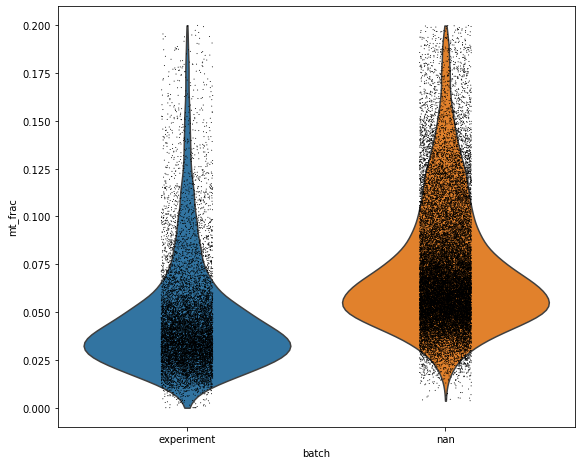

In [21]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata_combined, 'n_counts', groupby='batch', size=2, log=True, cut=0, save='_ReprNeru_adult_n_counts.pdf')
t1 = sc.pl.violin(adata_combined, 'n_genes', groupby='batch', size=2, log=True, cut=0, save='_ReprNeru_adult_n_genes.pdf')
t2 = sc.pl.violin(adata_combined, 'mt_frac', groupby='batch')

In [29]:
adata_combined.write(data_dir + 'ReprNeur_combined_postFiltering_log.h5ad')

... storing 'SRR run accession' as categorical
... storing 'UMI_CellularBarcode' as categorical
... storing 'batch' as categorical
... storing 'characteristics: age' as categorical
... storing 'characteristics: cell cluster' as categorical
... storing 'characteristics: sex of pooled animals' as categorical
... storing 'characteristics: strain' as categorical
... storing 'library_name' as categorical
... storing 'molecule' as categorical
... storing 'organism' as categorical
... storing 'predicted_doublets' as categorical
... storing 'raw file (original file name)' as categorical
... storing 'source name' as categorical
... storing 'feature_types-reprogramming' as categorical
... storing 'genome-reprogramming' as categorical
... storing 'feature_types-reprogramming' as categorical
... storing 'genome-reprogramming' as categorical


# 2 Batch correction with Harmony

In [19]:
adata_combined = sc.read(data_dir + 'ReprNeur_combined_postFiltering_log.h5ad')

In [31]:
adata_combined

AnnData object with n_obs × n_vars = 34198 × 16246 
    obs: 'SRR run accession', 'UMI_CellularBarcode', 'batch', 'characteristics: age', 'characteristics: cell cluster', 'characteristics: sex of pooled animals', 'characteristics: strain', 'dataset', 'doublet_scores', 'lenti_count', 'lenti_log1p_count', 'library_name', 'log_counts', 'molecule', 'mt_count', 'mt_frac', 'n_counts', 'n_genes', 'organism', 'predicted_doublets', 'raw file (original file name)', 'source name', 'tdT_count', 'tdT_log1p_count'
    var: 'gene_ids-reprogramming', 'feature_types-reprogramming', 'genome-reprogramming', 'n_cells-reprogramming', 'n_cells-neurogenesis'
    layers: 'counts'

In [38]:
adata_combined.obs['dataset'].value_counts()

neurogenesis     23831
reprogramming    10367
Name: dataset, dtype: int64

In [39]:
adata_combined.obs['library_name'].value_counts()

BL41_reprogrammed    5756
BL42_control         4611
10X83_4              2640
10X84_4              2632
10X83_2              2410
10X83_3              2369
10X82_1              2285
10X84_3              2219
10X84_2              2212
10X79_2              1949
10X80_1              1878
10X80_2              1877
10X79_1              1360
Name: library_name, dtype: int64

### 3.1 Calculating and keep top 2500 Highly Variable Genes (HVGs) with scanpy

In [33]:
n_genes = 2500

sc.pp.recipe_zheng17(adata_combined, n_top_genes = 2500, log=False) # log=False as adata.X is already log-transformed

running recipe zheng17
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)
    finished (0:00:04)


In [34]:
# Make sure adata has the correct shape
assert adata_combined.X.shape == (34198, 2500)

### 3.2 Performing PCA with scanpy

In [35]:
sc.tl.pca(adata_combined, n_comps=50)

computing PCA with n_comps = 50
    finished (0:00:02)


In [36]:
adata_combined

AnnData object with n_obs × n_vars = 34198 × 2500 
    obs: 'SRR run accession', 'UMI_CellularBarcode', 'batch', 'characteristics: age', 'characteristics: cell cluster', 'characteristics: sex of pooled animals', 'characteristics: strain', 'dataset', 'doublet_scores', 'lenti_count', 'lenti_log1p_count', 'library_name', 'log_counts', 'molecule', 'mt_count', 'mt_frac', 'n_counts', 'n_genes', 'organism', 'predicted_doublets', 'raw file (original file name)', 'source name', 'tdT_count', 'tdT_log1p_count', 'n_counts_all'
    var: 'gene_ids-reprogramming', 'feature_types-reprogramming', 'genome-reprogramming', 'n_cells-reprogramming', 'n_cells-neurogenesis', 'n_counts'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

### 3.3 Running Harmony

Note: Harmony needs PCs as input. 

In [37]:
# Make sure data dimensonality is good
assert adata_combined.X.shape == (34198, 2500)
assert adata_combined.obsm['X_pca'].shape == (34198, 50)

In [40]:
meta_data = adata_combined.obs # adata.obs can be used directly as metadata
vars_use = ['dataset', 'library_name'] # Multi-variate correction: first correct between batch, 
                                     # then correct within batch between libraries
data_mat = adata_combined.obsm['X_pca'] # Initial data is PCA output

In [41]:
ho = hm.run_harmony(data_mat, meta_data, vars_use, max_iter_kmeans=50) # Run Harmony till convergence

2021-07-29 15:35:49,551 - harmonypy - INFO - Iteration 1 of 50
2021-07-29 15:36:01,121 - harmonypy - INFO - Iteration 2 of 50
2021-07-29 15:36:12,589 - harmonypy - INFO - Iteration 3 of 50
2021-07-29 15:36:27,258 - harmonypy - INFO - Iteration 4 of 50
2021-07-29 15:36:36,966 - harmonypy - INFO - Iteration 5 of 50
2021-07-29 15:36:43,151 - harmonypy - INFO - Converged after 5 iterations


In [42]:
# ho.Z_corr holds the corrected matrix, but transposed
assert ho.Z_corr.shape == (50, 34198)

In [43]:
adata_combined.obsm['Harmony'] = ho.Z_corr.T

In [44]:
adata_combined

AnnData object with n_obs × n_vars = 34198 × 2500 
    obs: 'SRR run accession', 'UMI_CellularBarcode', 'batch', 'characteristics: age', 'characteristics: cell cluster', 'characteristics: sex of pooled animals', 'characteristics: strain', 'dataset', 'doublet_scores', 'lenti_count', 'lenti_log1p_count', 'library_name', 'log_counts', 'molecule', 'mt_count', 'mt_frac', 'n_counts', 'n_genes', 'organism', 'predicted_doublets', 'raw file (original file name)', 'source name', 'tdT_count', 'tdT_log1p_count', 'n_counts_all'
    var: 'gene_ids-reprogramming', 'feature_types-reprogramming', 'genome-reprogramming', 'n_cells-reprogramming', 'n_cells-neurogenesis', 'n_counts'
    uns: 'pca'
    obsm: 'X_pca', 'Harmony'
    varm: 'PCs'
    layers: 'counts'

In [45]:
adata_combined.obsm['Harmony']

array([[ 9.9990759e+00, -2.7974751e+00, -4.1728282e+00, ...,
         4.8984614e-01, -1.1972148e+00, -5.9910852e-01],
       [-2.0840824e+00,  4.4217673e-01, -1.0415804e+01, ...,
         1.0319477e+00, -3.9139226e-02, -5.2913222e-03],
       [ 2.0869879e+01, -5.8709383e+00,  1.3638699e+00, ...,
        -2.0562255e+00, -3.7743366e+00, -1.0460337e+00],
       ...,
       [-9.5523491e+00, -7.0751748e+00,  7.1367917e+00, ...,
        -6.6981085e-02,  5.8734190e-01,  2.0670545e-01],
       [-1.0369594e+01, -8.0369692e+00,  8.2141619e+00, ...,
        -1.8425395e+00, -5.8888495e-01,  1.9352067e+00],
       [-9.6628342e+00, -7.3151760e+00,  5.4932699e+00, ...,
        -3.9205348e-01, -3.4768450e-01,  2.2240499e-01]], dtype=float32)

In [46]:
adata_combined.write(data_dir + 'ReprNeur_postFiltering_log_pcs50_Harmony.h5ad')

# 3 Clustering and cell typing

In [47]:
adata_combined = sc.read(data_dir + 'ReprNeur_postFiltering_log_pcs50_Harmony.h5ad')

### 4.1 Louvain clustering and single-cell embedding with PAGA

computing neighbors


/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostic

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:12)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 21 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:06)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:02)
--> added 'pos', the PAGA positions (adata.uns['paga'])


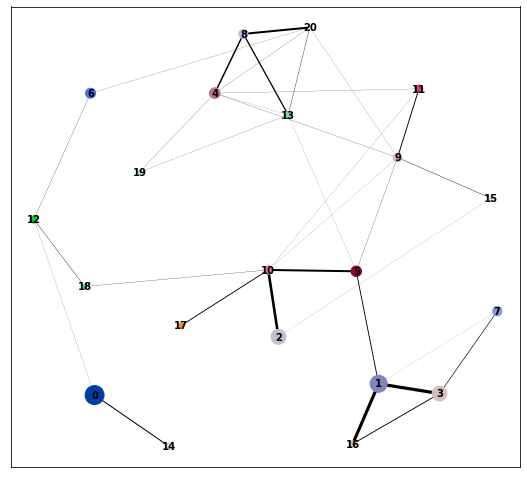

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:41)


In [48]:
sc.pp.neighbors(
    adata_combined,
    use_rep='Harmony',  
#    random_state=random_seed 
)

sc.tl.louvain(
    adata_combined,
    resolution=0.50,
#    random_state=random_seed
)

sc.tl.paga(
    adata_combined,
    groups='louvain', 
)

sc.pl.paga(
    adata_combined, 
    color=['louvain'], 
    use_raw=True,
    layout='fr',
    threshold=0.01,
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed,
)

sc.tl.umap(
    adata_combined,
    init_pos='paga',
#    random_state=random_seed,
)

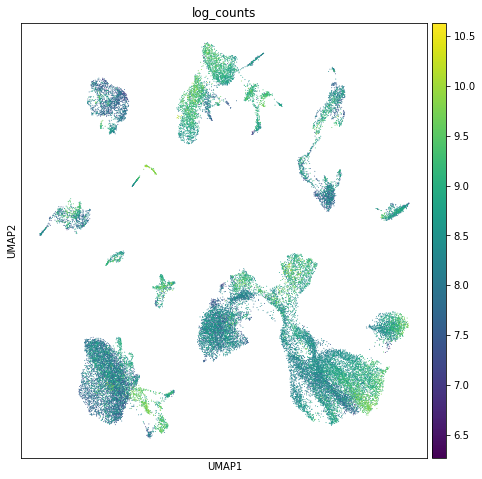

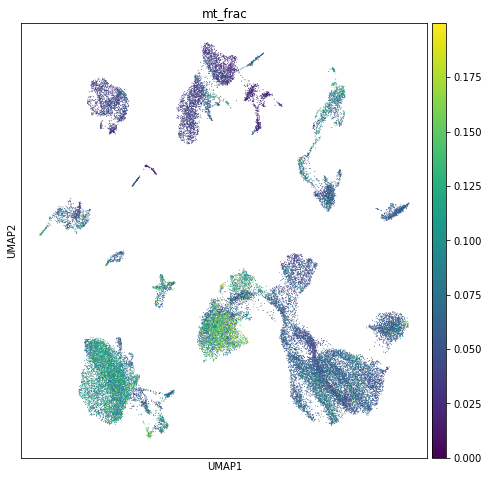

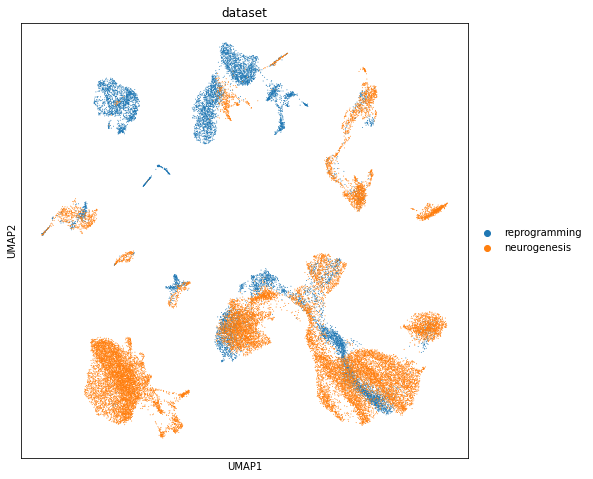

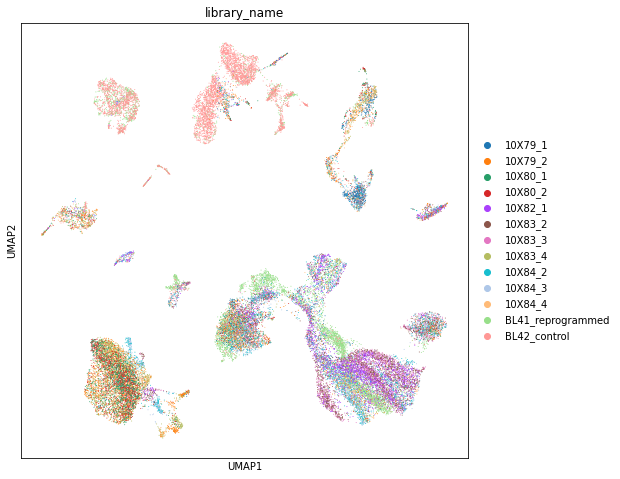

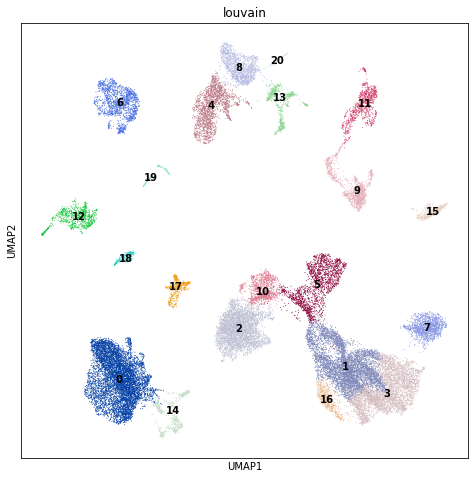

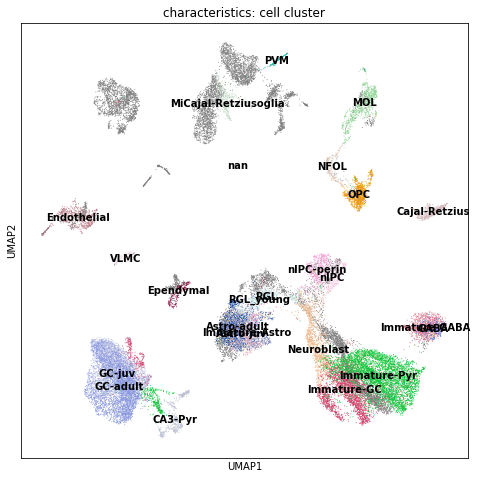

In [53]:
# Visualize sequencing depth, library distribution, and Louvain clusters
sc.pl.umap(adata_combined, color='log_counts')
sc.pl.umap(adata_combined, color='mt_frac')
sc.pl.umap(adata_combined, color='dataset')
sc.pl.umap(adata_combined, color='library_name')
sc.pl.umap(adata_combined, color='louvain', legend_loc='on data', )
sc.pl.umap(adata_combined, color='characteristics: cell cluster', legend_loc='on data', )

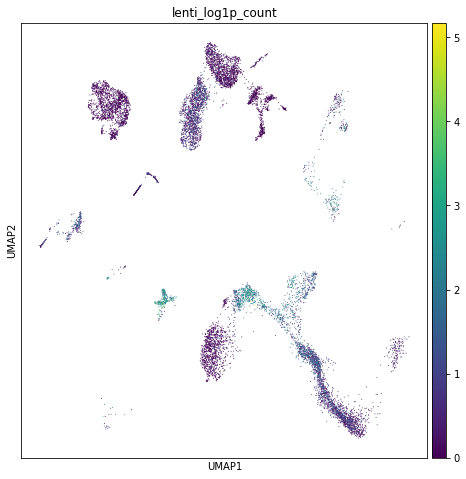

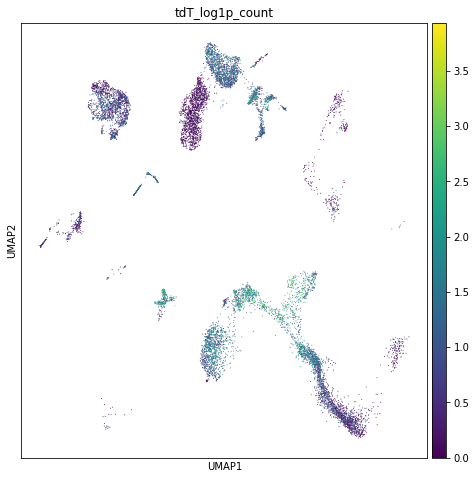

In [50]:
# Visualize lentivirus and tdT expression levels
sc.pl.umap(adata_combined, color='lenti_log1p_count')
sc.pl.umap(adata_combined, color='tdT_log1p_count')

In [51]:
adata_combined.write(data_dir + 'ReprNeur_postFiltering_log_pcs50_Harmony_PAGA_louvain.h5ad')

### 4.2 Coarse cell typing

In [52]:
adata_combined = sc.read(data_dir + 'ReprNeur_postFiltering_log_pcs50_Harmony_PAGA_louvain.h5ad')

#### References: 
Brain cell typing: Cell types in the mouse cortex and hippocampus revealed by single-cell RNA-seq (Zeisel et al. 2015), and A single-cell atlas of mouse brain macrophages reveals unique transcriptional identities shaped by ontogeny and tissue environment (Van Hove et al. 2019)


M1 and M2 macrophages: Different distributions of M1 and M2 macrophages in a mouse model of laser-induced choroidal neovascularization (Zhou et al. 2017)

#### 4.2.7 Neural cells (neuronal cells and glial cells)

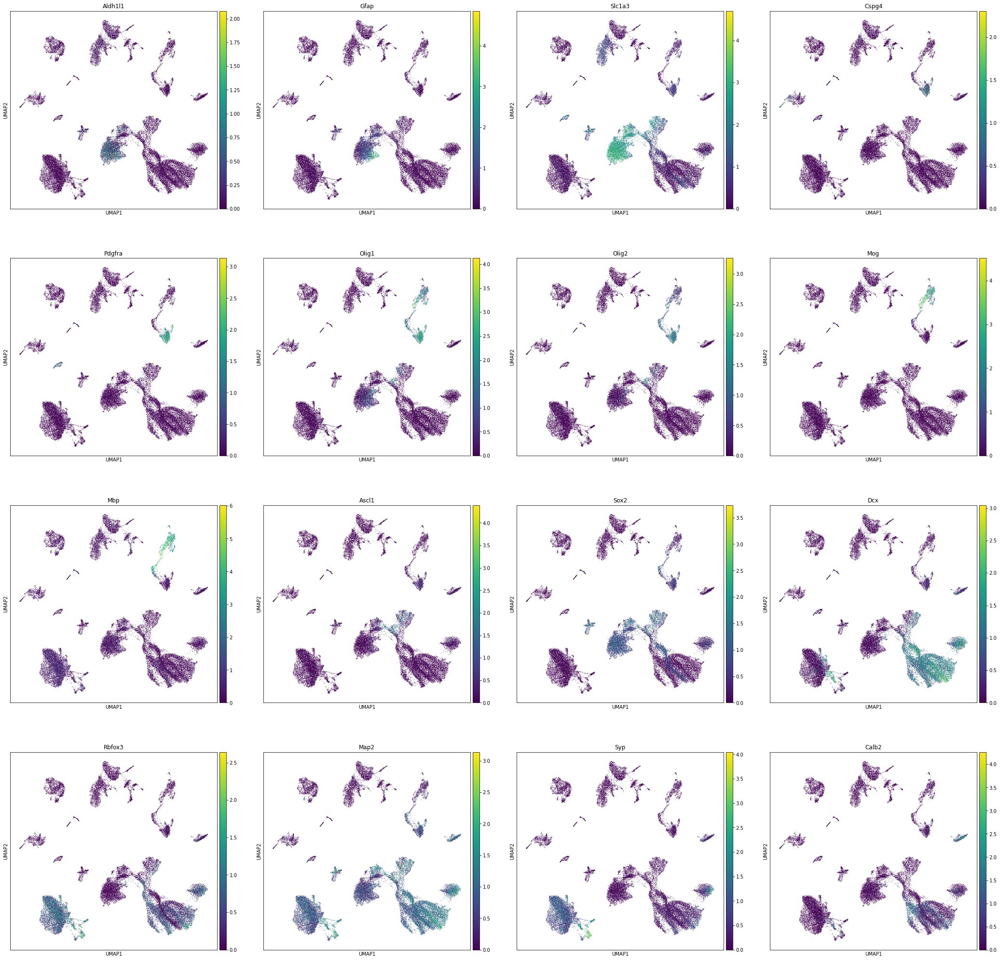

In [59]:
sc.pl.umap(adata_combined, color=['Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers; clusters 2, 13 ,and parts of 6, 10
                         'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers; top half of cluster 14
                         'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers; bottom half of cluster 14
                         'Ascl1', 'Sox2', # Neural stem/progenitor cells markers; clusters 6, 10, interestingly, non-overlapping with Aldh1l1 expr
                         'Dcx', # Neuroblast marker; clusters 1, 4, and parts of 6 and 10
                         'Rbfox3', 'Map2', 'Syp', # Mature neuron markers; somewhat in cluster 1
                         'Calb2'], # GABAergic neuron marker; tip of cluster 1
           use_raw=True) 

#### 4.2.7 Re-labeling clusters

In [61]:
adata_combined.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20'],
      dtype='object')

In [63]:
# Summarize the findings and label the clusters
adata_combined.obs['louvain'].cat.categories = ['0', 'Neuroblasts', 'Astrocytes', 'Immature-GC/-Pyr/Neuroblasts', 
                                                '4', 'nIPCs/NPCs', 
                                                '6', '7', '8', '9', 
                                                'RGL/Lenti-astrocytes',
                                                '11', '12', '13', '14', '15', 'Immature-GC', '17', '18', '19', '20']

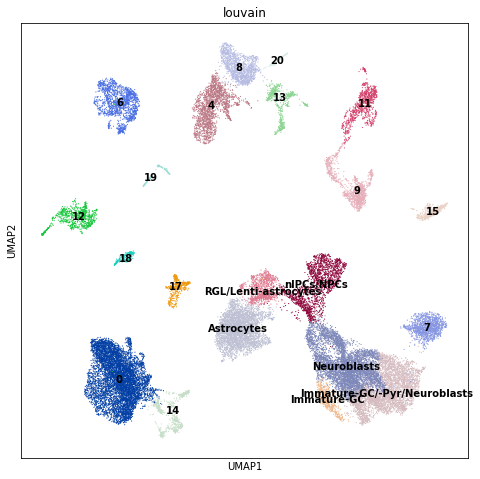

In [64]:
sc.pl.umap(adata_combined, color='louvain', legend_loc='on data', size=5, 
#           save='_AllCells_louvain_annot.pdf'
          )

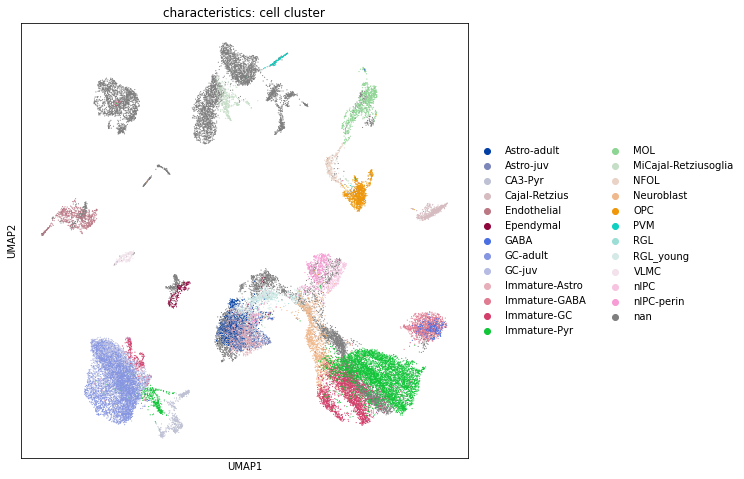

In [65]:
sc.pl.umap(adata_combined, color='characteristics: cell cluster', legend_loc='right margin', size=5, 
#           save='_AllCells_louvain_annot.pdf'
          )

In [66]:
# Based on Hochgerner et al.'s annotation, keep only cell clusters in the neurogenesis trajectory

In [10]:
adata_plot = adata_combined[adata_combined.obs['louvain'].isin(['Astrocytes', 'RGL/Lenti-astrocytes', 'nIPCs/NPCs',
                                                                'Immature-GC/-Pyr/Neuroblasts', 'Neuroblasts', 'Immature-GC']), :]

In [11]:
marker_genes_subset = ['Aldh1l1', 
                       'Gfap', 
                       'Slc1a3', # Astrocyte markers
                       'Cspg4', 
                       'Ascl1', 
                       'Dcx', 'Dlx2',  # Neuroblast marker
                       'Rbfox3', 'Map2', 'Syp', # Mature neuronal markers
                       'Sox2', # Neural stem/progenitor cells markers
                       'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
                       'Olig1', 'Olig2', 
                       'Mog', 
                       'Mbp', # Oligodendrocyte markers
                      ]

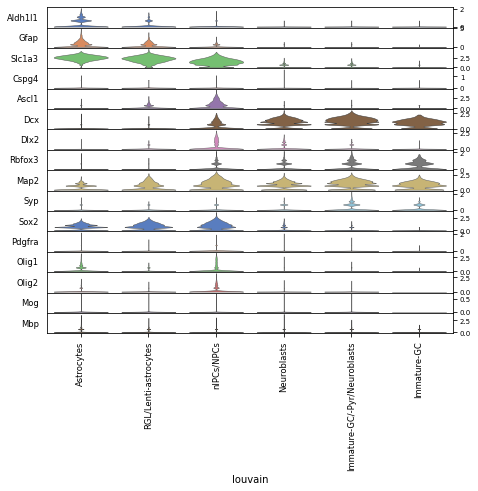

In [12]:
ax = sc.pl.stacked_violin(adata_plot, marker_genes_subset, groupby='louvain', dendrogram=False, swap_axes=True,
#                          var_group_positions= [(0, 0), (2,3)], var_group_labels=['Endothelial', 'Microglial'],
                          figsize=(8, 6), 
                          use_raw=True, 
                          order=['Astrocytes', 'RGL/Lenti-astrocytes', 'nIPCs/NPCs',
                                'Neuroblasts', 'Immature-GC/-Pyr/Neuroblasts', 'Immature-GC'],
#                          save='_ReprAdultNeur_neuralCells_marker_subpanel.pdf'
                         )

In [75]:
adata_combined.write(data_dir + 'ReprNeur_postFiltering_log_pcs50_Harmony_PAGA_louvain_annot.h5ad')

### 4.3 BL41 is enriched in neural cells compared to BL42

In [7]:
adata_combined = sc.read(data_dir + 'ReprNeur_postFiltering_log_pcs50_Harmony_PAGA_louvain_annot.h5ad')

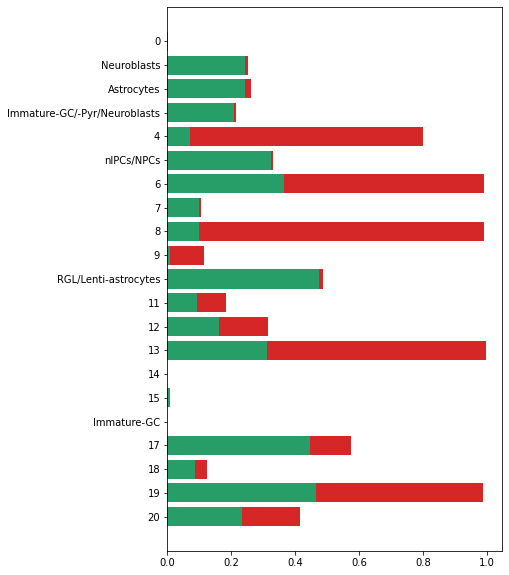

In [78]:
# Plot cell type compoisition of BL41 and BL42
fig, ax = plt.subplots(figsize=(6,10))
N = len(adata_combined.obs['louvain'].cat.categories)

# Sample11_louvain_proportions = (adata_combined.obs[adata_combined.obs['library_name']=='10X_sample11']['louvain'].value_counts(sort=False) / adata_combined.obs['louvain'].value_counts(sort=False))
# Sample51_louvain_proportions = (adata_combined.obs[adata_combined.obs['library_name']=='10X_sample51']['louvain'].value_counts(sort=False) / adata_combined.obs['louvain'].value_counts(sort=False))
WT_proportions = (adata_combined.obs[adata_combined.obs['library_name'].isin(['10X_sample11','10X_sample51'])]['louvain'].value_counts(sort=False) / adata_combined.obs['louvain'].value_counts(sort=False))
BL41_louvain_proportions = (adata_combined.obs[adata_combined.obs['library_name']=='BL41_reprogrammed']['louvain'].value_counts(sort=False) / adata_combined.obs['louvain'].value_counts(sort=False))
BL42_louvain_proportions = (adata_combined.obs[adata_combined.obs['library_name']=='BL42_control']['louvain'].value_counts(sort=False) / adata_combined.obs['louvain'].value_counts(sort=False))

ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence


ax.barh(ind, WT_proportions, align='center', color=adata_combined.uns['library_name_colors'][1])
ax.barh(ind, BL41_louvain_proportions, align='center', 
        left=WT_proportions, color=adata_combined.uns['library_name_colors'][2])
ax.barh(ind, BL42_louvain_proportions, align='center', 
        left=WT_proportions+BL41_louvain_proportions, color=adata_combined.uns['library_name_colors'][3])


ax.set_yticks(ind)
ax.set_yticklabels(adata_combined.obs['louvain'].cat.categories)
ax.invert_yaxis()  # labels read top-to-bottom
# ax.set_xlabel('Performance')
# ax.set_title('How fast do you want to go today?')
# plt.legend(('WT E18.5', 'BL41_reprogrammed', 'BL42_control'))

# plt.savefig('./figures/hbar_allCells_louvain_r0.5_cluster_composition.pdf')

plt.show()

# 5 Pseudotime analysis

### 5.1 Removing cell clusters that are unrelated to reprogramming

#### 5.1.1 Create a filter

In [79]:
clusters_include = ['Astrocytes', 'RGL/Lenti-astrocytes', 'nIPCs/NPCs',
                    'Neuroblasts', 'Immature-GC/-Pyr/Neuroblasts', 'Immature-GC']

In [80]:
index_include = []
for index in adata_combined.obs.index:
    if adata_combined.obs['louvain'][index] in clusters_include: 
        index_include.append(index)

In [82]:
assert len(index_include) == 16078

#### 5.1.2 Subset full dataset

In [83]:
# Read Harmonized, but unclustered single-cell data
adata_tmp = sc.read(data_dir + 'ReprNeur_postFiltering_log_pcs50_Harmony.h5ad')

In [84]:
adata_neural = adata_tmp[index_include,:]

In [85]:
adata_neural.var_names_make_unique()

In [86]:
adata_neural

View of AnnData object with n_obs × n_vars = 16078 × 2500 
    obs: 'SRR run accession', 'UMI_CellularBarcode', 'batch', 'characteristics: age', 'characteristics: cell cluster', 'characteristics: sex of pooled animals', 'characteristics: strain', 'dataset', 'doublet_scores', 'lenti_count', 'lenti_log1p_count', 'library_name', 'log_counts', 'molecule', 'mt_count', 'mt_frac', 'n_counts', 'n_genes', 'organism', 'predicted_doublets', 'raw file (original file name)', 'source name', 'tdT_count', 'tdT_log1p_count', 'n_counts_all'
    var: 'gene_ids-reprogramming', 'feature_types-reprogramming', 'genome-reprogramming', 'n_cells-reprogramming', 'n_cells-neurogenesis', 'n_counts'
    uns: 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [87]:
del adata_tmp

In [89]:
adata_neural.obs['characteristics: age'].value_counts()

nan      4221
P0       3685
P5       2956
E16.5    1966
P132      870
P23       713
P120      641
P19       530
P18       496
Name: characteristics: age, dtype: int64

In [92]:
index_include = adata_neural.obs['characteristics: age'].isin(['E16.5', 'P0', 'P5'])
index_include = [not exclude for exclude in index_include]

In [93]:
sum(index_include)

7471

In [94]:
adata_neural = adata_neural[index_include, :]

In [95]:
adata_neural.obs['characteristics: age'].value_counts()

nan     4221
P132     870
P23      713
P120     641
P19      530
P18      496
Name: characteristics: age, dtype: int64

In [96]:
adata_neural.write(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony.h5ad')

#### 5.1.3 Re-cluster cells with finer resolution 

In [97]:
adata_neural = sc.read(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony.h5ad')

In [99]:
adata_neural

AnnData object with n_obs × n_vars = 7471 × 2500 
    obs: 'SRR run accession', 'UMI_CellularBarcode', 'batch', 'characteristics: age', 'characteristics: cell cluster', 'characteristics: sex of pooled animals', 'characteristics: strain', 'dataset', 'doublet_scores', 'lenti_count', 'lenti_log1p_count', 'library_name', 'log_counts', 'molecule', 'mt_count', 'mt_frac', 'n_counts', 'n_genes', 'organism', 'predicted_doublets', 'raw file (original file name)', 'source name', 'tdT_count', 'tdT_log1p_count', 'n_counts_all'
    var: 'gene_ids-reprogramming', 'feature_types-reprogramming', 'genome-reprogramming', 'n_cells-reprogramming', 'n_cells-neurogenesis', 'n_counts'
    uns: 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

computing neighbors
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:03)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


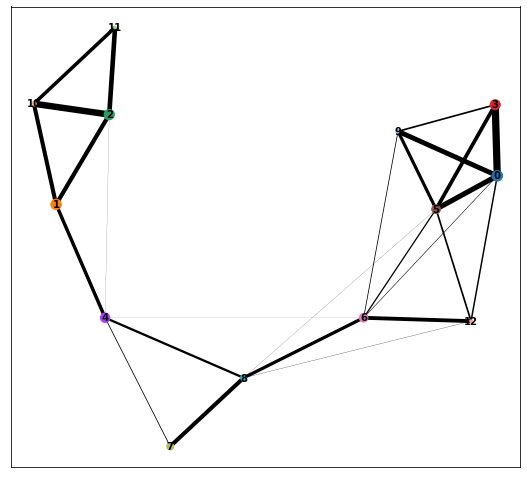

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:22)


In [100]:
sc.pp.neighbors(
    adata_neural,
#    use_rep='X_pca',  
    use_rep='Harmony',  
#    random_state=random_seed
)

sc.tl.louvain(
    adata_neural,
    resolution=1.00,
#    resolution=1.50,
    #    random_state=random_seed
)

sc.tl.paga(
    adata_neural,
    groups='louvain',  
)

sc.pl.paga(
    adata_neural, 
    color=['louvain'], 
    use_raw=True,
#    use_raw=False,
#    layout='fa', 
    layout='fr', 
    threshold=0.01, 
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed, 
#     save='_AllNeural_PAGA_connectivity.pdf'
)

sc.tl.umap(
    adata_neural,
    init_pos='paga', 
#    random_state=random_seed,
)

#sc.pl.pca_scatter(adata, color='n_counts')
#sc.pl.pca_scatter(adata, color='library_name')
#sc.pl.tsne(adata, color='n_counts')

In [102]:
adata_neural.write(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

In [7]:
adata_neural = sc.read(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

In [9]:
adata_neural.obs['library_name'].value_counts()

BL41_reprogrammed    4039
10X84_4               713
10X79_1               641
10X79_2               530
10X83_4               496
10X80_2               468
10X80_1               402
BL42_control          182
Name: library_name, dtype: int64

In [10]:
adata_neural.obs['batch'].value_counts()

experiment    4221
nan           3250
Name: batch, dtype: int64

In [12]:
adata_neural.obs['characteristics: age'].value_counts()

nan     4221
P132     870
P23      713
P120     641
P19      530
P18      496
Name: characteristics: age, dtype: int64

In [178]:
# # Make the two WT E18.5 libraries' colors consistent
# adata_neural.uns['library_name_colors'][0] = adata_neural.uns['library_name_colors'][1]

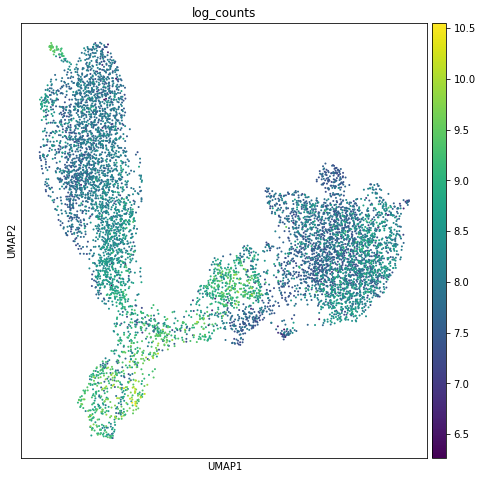

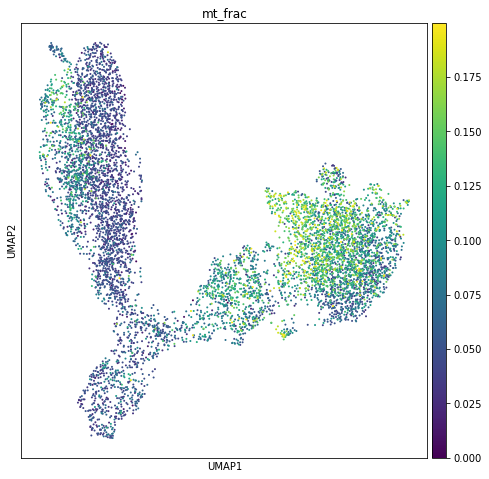

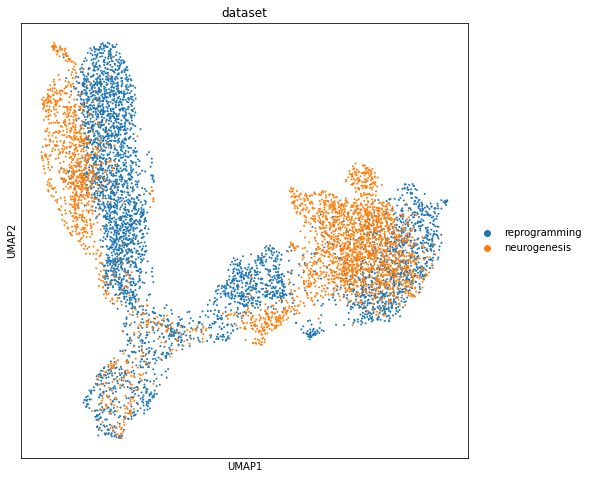

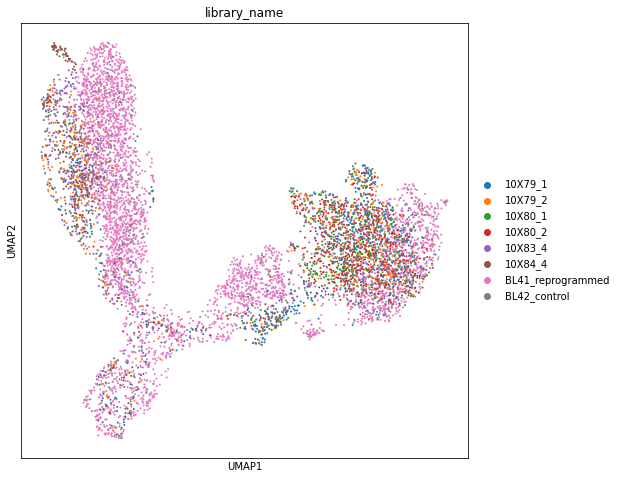

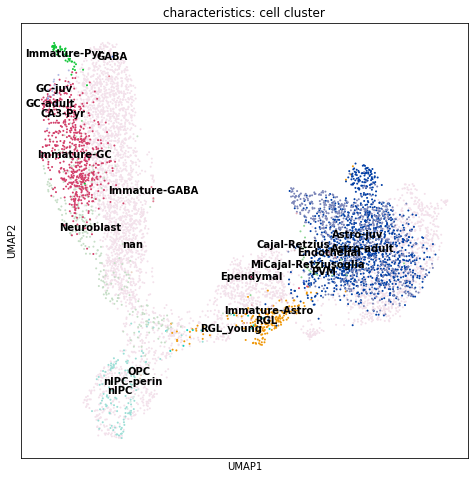

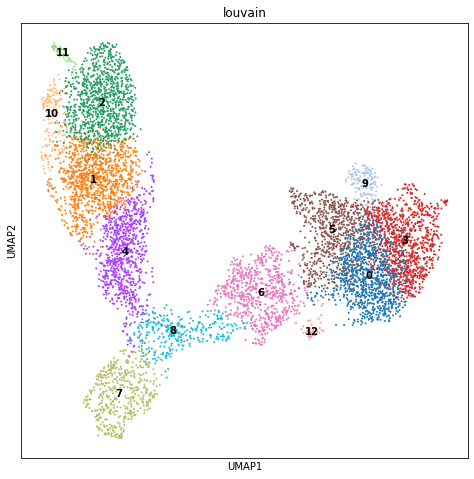

In [14]:
# Visualize sequencing depth, library distribution, and Louvain clusters
sc.pl.umap(adata_neural, color='log_counts', 
#          save='_AllNeural_log_counts.pdf'
          )
sc.pl.umap(adata_neural, color='mt_frac', 
#           save='_AllNeural_mt_frac.pdf'
          )
sc.pl.umap(adata_neural, color='dataset', 
#          save='_AllNeural_library_name.pdf'
          )
sc.pl.umap(adata_neural, color='library_name', 
#          save='_AllNeural_library_name.pdf'
          )
sc.pl.umap(adata_neural, color='characteristics: cell cluster', 
#           legend_loc='on data', 
          save='_AllNeural_louvain.pdf'
          )
sc.pl.umap(adata_neural, color='louvain', legend_loc='on data', 
#          save='_AllNeural_louvain.pdf'
          )

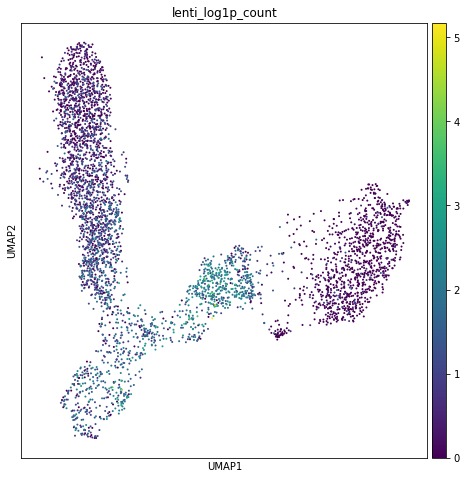

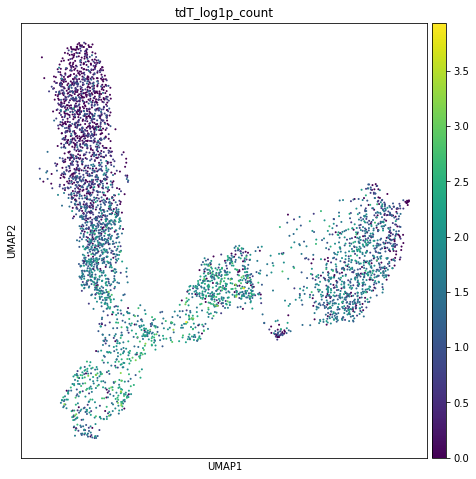

In [105]:
# Visualize lenti and tdT expression
sc.pl.umap(adata_neural, color='lenti_log1p_count', 
#          save='_AllNeural_log_counts.pdf'
          )
sc.pl.umap(adata_neural, color='tdT_log1p_count', 
#           save='_AllNeural_mt_frac.pdf'
          )

#### 5.1.4 Annotate clusters

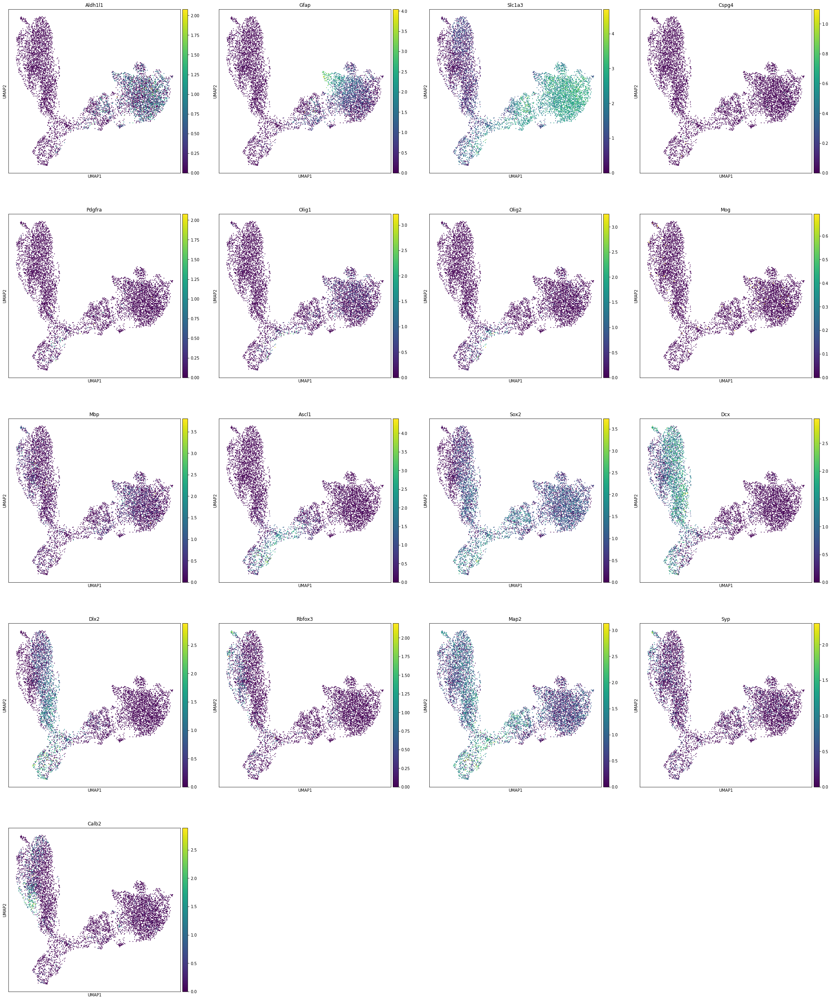

In [106]:
sc.pl.umap(adata_neural, color=['Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers; clusters 1, 7, 12, 13
                         'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers; cluster 11
                         'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers; cluster 15
                         'Ascl1', 'Sox2', # Neural stem/progenitor cells markers; clusters 4, 5, 8
                         'Dcx', 'Dlx2', # Neuroblast marker; clusters 0, 2, 3, 6, 17
                         'Rbfox3', 'Map2', 'Syp', # Mature neuron markers
                         'Calb2'], # GABAergic neuron marker
           use_raw=True) 
# Clusters 9, 10, 16 are lenti-astrocytes

In [107]:
adata_neural.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12'], dtype='object')

In [108]:
# Summarizing the findings: 
adata_neural.rename_categories('louvain', ['Astrocytes-1', 'Neuroblasts-2', 'Neuroblasts-3', 
                                           'Astrocytes-2', 'Neuroblasts-1', 'Astrocytes-3',
                                           'Lenti-astrocytes/RGLs', 'nIPCs/Cycling NPCs', 'NPCs',
                                           'Astrocytes-4', 'Granule cells', 'Immature-Pyr', 
                                           'Astrocytes-5'])

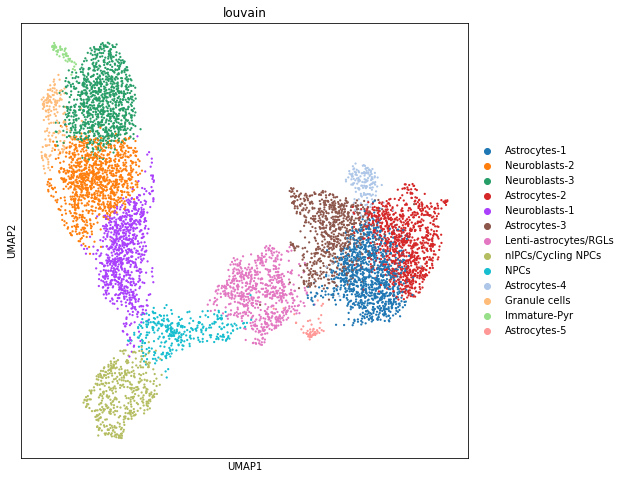

In [22]:
sc.pl.umap(adata_neural, color='louvain', 
#           legend_loc='on data', 
           size=20,
           save='_ReprAdultNeur_AllNeural_louvain_annot.pdf'
          )

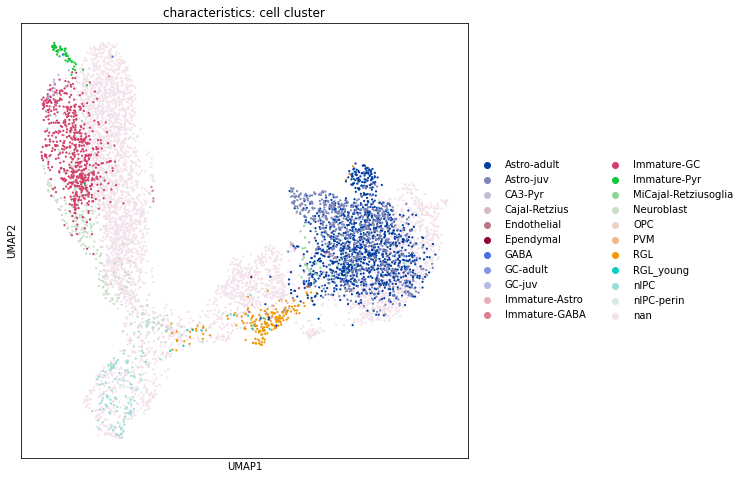

In [23]:
sc.pl.umap(adata_neural, color='characteristics: cell cluster', 
#           legend_loc='on data', 
           size=20,
           save='_ReprAdultNeur_AllNeural_louvain_Hochgerner_clusters.pdf'
          )

In [19]:
marker_genes_subset = ['Aldh1l1', 
                       # 'Gfap', 
                       'Slc1a3', # Astrocyte markers
                       #'Cspg4', 
                       'Ascl1', 
                       'Dcx', # Neuroblast marker
                       #'Sox2', # Neural stem/progenitor cells markers
                       'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
                       'Olig1', 'Olig2', 
                       #'Mog', 
                       'Mbp', # Oligodendrocyte markers
                      ]

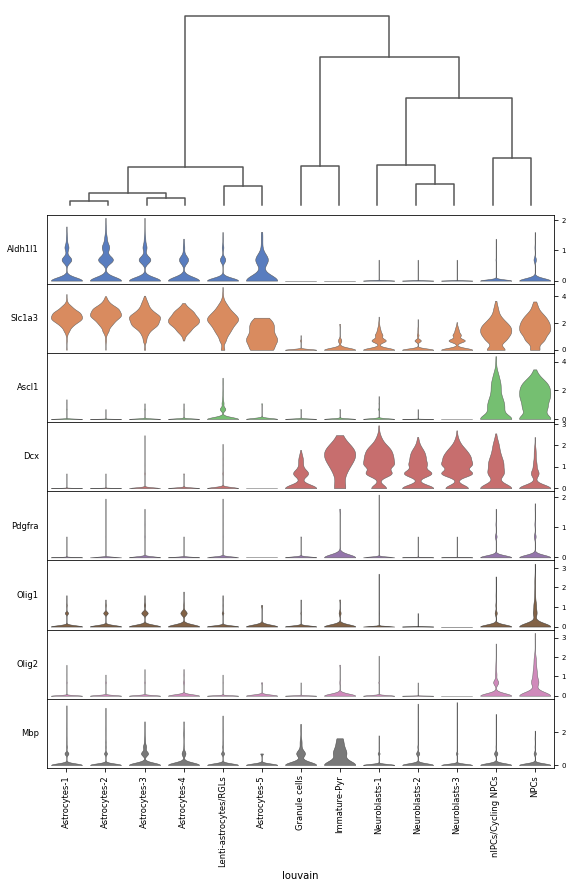

In [20]:
ax = sc.pl.stacked_violin(adata_neural, marker_genes_subset, groupby='louvain', dendrogram=True, swap_axes=True,
                          figsize=(10, 14), 
                          use_raw=True, 
                         save='_ReprAdultNeur_NeuralCells_marker_panel.pdf' 
                         )

In [112]:
adata_neural.write(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann.h5ad')

### 5.2 Pseudotime analysis

In [15]:
adata_neural = sc.read(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann.h5ad')

In [114]:
# Choose a random cell from resident astrocytes as the root of pseudotime
adata_neural.uns['iroot'] = np.flatnonzero(adata_neural.obs['louvain']=='Astrocytes-2')[0]

In [115]:
sc.tl.dpt(adata_neural)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99888    0.99457455 0.98387533 0.9780515  0.96390474
     0.95640624 0.95015234 0.94850713 0.9452156  0.9450362  0.9414864
     0.93725866 0.9350551  0.93171   ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


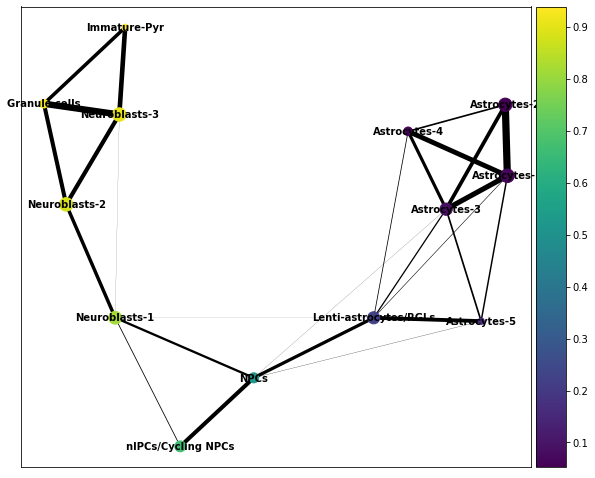

In [116]:
sc.pl.paga(adata_neural, color=['dpt_pseudotime'], use_raw=True)

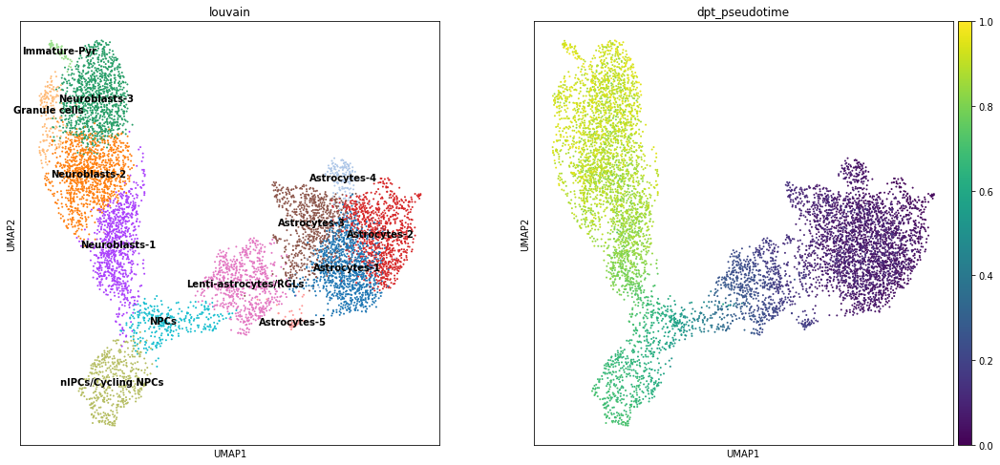

In [117]:
sc.pl.umap(adata_neural, color=['louvain', 'dpt_pseudotime'], legend_loc='on data')

In [118]:
# Calculate order of Louvain clusters based on their median pseudotime
pseudotime_median = []
for cluster in adata_neural.obs['louvain'].cat.categories:
    pseudotime_median.append(adata_neural.obs['dpt_pseudotime'][adata_neural.obs['louvain']==cluster].median())

data = {'clusters': adata_neural.obs['louvain'].cat.categories, 'pseudotime_median': pseudotime_median}

pd_pseudotime = pd.DataFrame(data=data)

pd_pseudotime.sort_values(by='pseudotime_median', inplace=True)

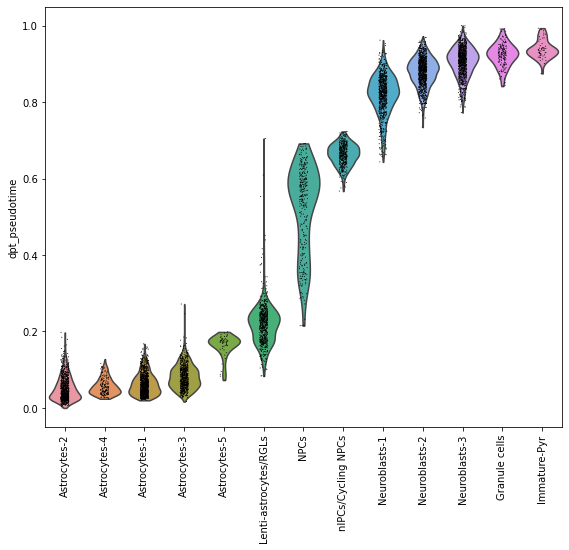

In [119]:
# Plot pseudotime in each cluster
sc.pl.violin(adata_neural, 'dpt_pseudotime', groupby='louvain', use_raw=True, rotation=90, order=pd_pseudotime['clusters'])

#### 5.3.2 Calculate pseudotime ranking

In [120]:
# Rank cells based on their pseudotime
array = np.array(adata_neural.obs['dpt_pseudotime'])

temp = array.argsort()

ranks = np.empty_like(temp)

ranks[temp] = np.arange(len(array))

In [121]:
adata_neural.obs['rank_pseudotime'] = ranks

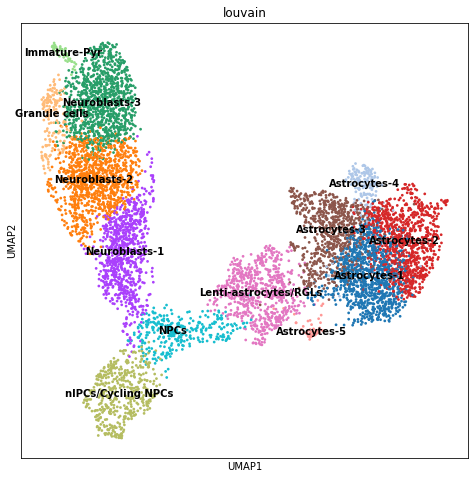

In [122]:
sc.pl.umap(adata_neural, color=['louvain'], size=30, legend_loc='on data', 
#           save='_MT_louvain.pdf'
          )

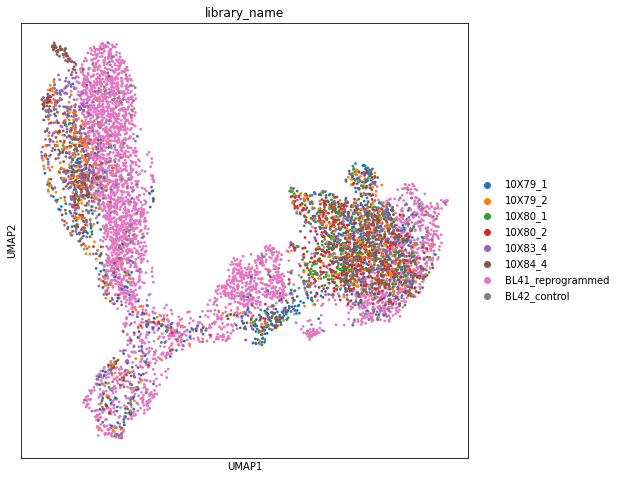

In [123]:
sc.pl.umap(adata_neural, color=['library_name'], size=30, 
#            save='_MT_library.pdf'
          )

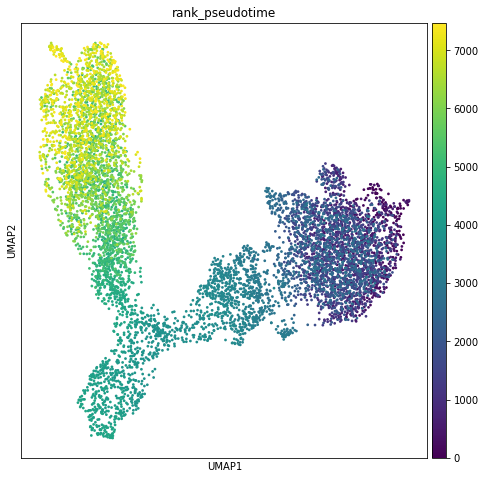

In [33]:
sc.pl.umap(adata_neural, color=['rank_pseudotime'], legend_loc='on data', size=30,
           save='_ReprAdultNeur_MT_rank_pseudotime.pdf'
          )

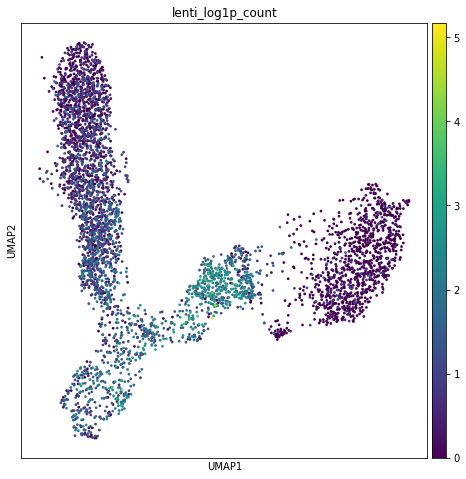

In [34]:
sc.pl.umap(adata_neural, color=['lenti_log1p_count'], legend_loc='on data', size=30,
           save='_ReprAdultNeur_MT_lenti_log1p_count.pdf'
          )

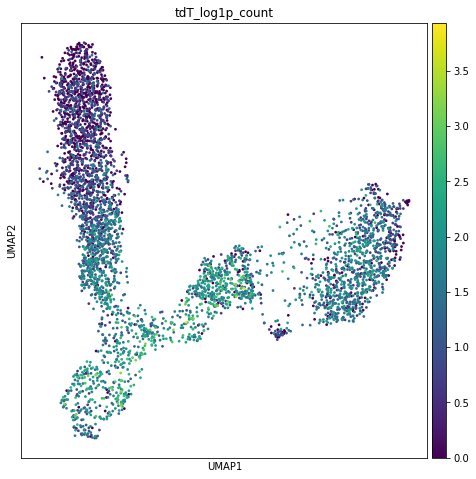

In [35]:
sc.pl.umap(adata_neural, color=['tdT_log1p_count'], legend_loc='on data', size=30,
           save='_ReprAdultNeur_MT_tdT_log1p_count.pdf'
          )

In [125]:
adata_neural.write(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

### 5.4 Examine known adult neurogenesis genes in dataset

In [24]:
adata_neural = sc.read(neural_data_dir + 'ReprNeur_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

#### 5.4.1 Markers from Dulken et al., 2017

In [25]:
# Rpl32 and Egfr have to be manually added to .obs. Otherwise, scanpy doesn't plot them correctly. 
for gene in ['Rpl32', 'Egfr', 'Cdk1', 'Ccna2', 'Mki67', 'Dlx1', 'Dlx2', 'Dcx', 'Dlx6os1']:

    adata_neural.obs[gene] = adata_neural.raw[:,gene].X

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


In [26]:
# Split dataset based on their origin

adata_repr = adata_neural[adata_neural.obs['dataset']=='reprogramming']

adata_neur = adata_neural[adata_neural.obs['dataset']=='neurogenesis']

In [27]:
genes_to_plot = ['Id3', 'Clu', 'Rpl32', 'Egfr', 'Cdk1', 'Ccna2', 'Mki67', 'Dlx1', 'Dlx2', 'Dcx', 'Dlx6os1']

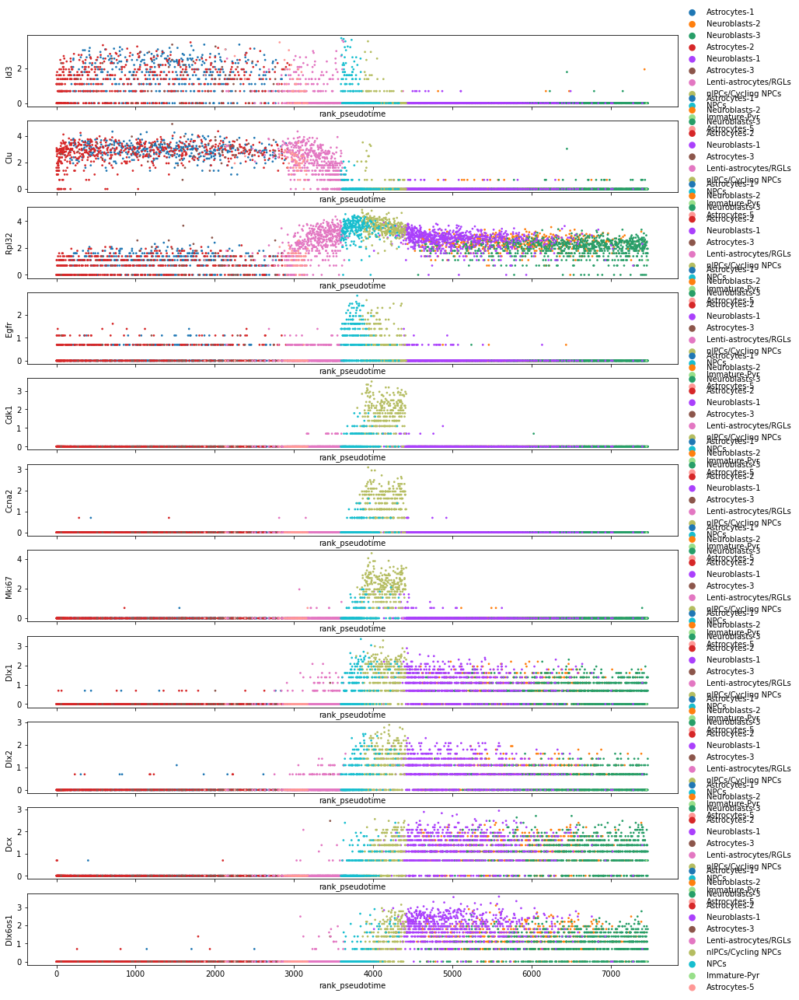

In [28]:
# adata_repr
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_repr, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_ReprAdultNeur_Dulken_markers_pseudotime_BL41lOnly.pdf')

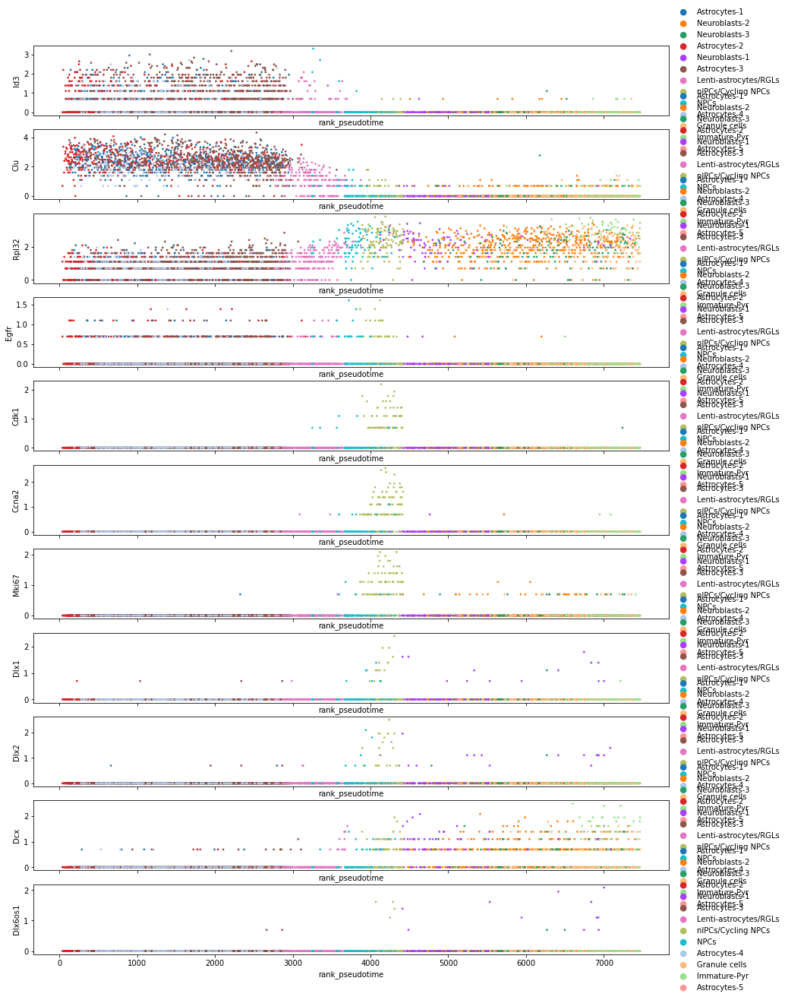

In [29]:
# adata_neur
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_neur, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_ReprAdultNeur_Dulken_markers_pseudotime_NeurOnly.pdf')

#### 5.4.2 Markers from Shin et al., 2015

In [30]:
genes_to_plot = ['Gfap', 'Apoe', 'Aldoc', 'Hopx',# qNSC
                 'Sox11', 'Eomes', 'Stmn1' # aNSC
                 ]

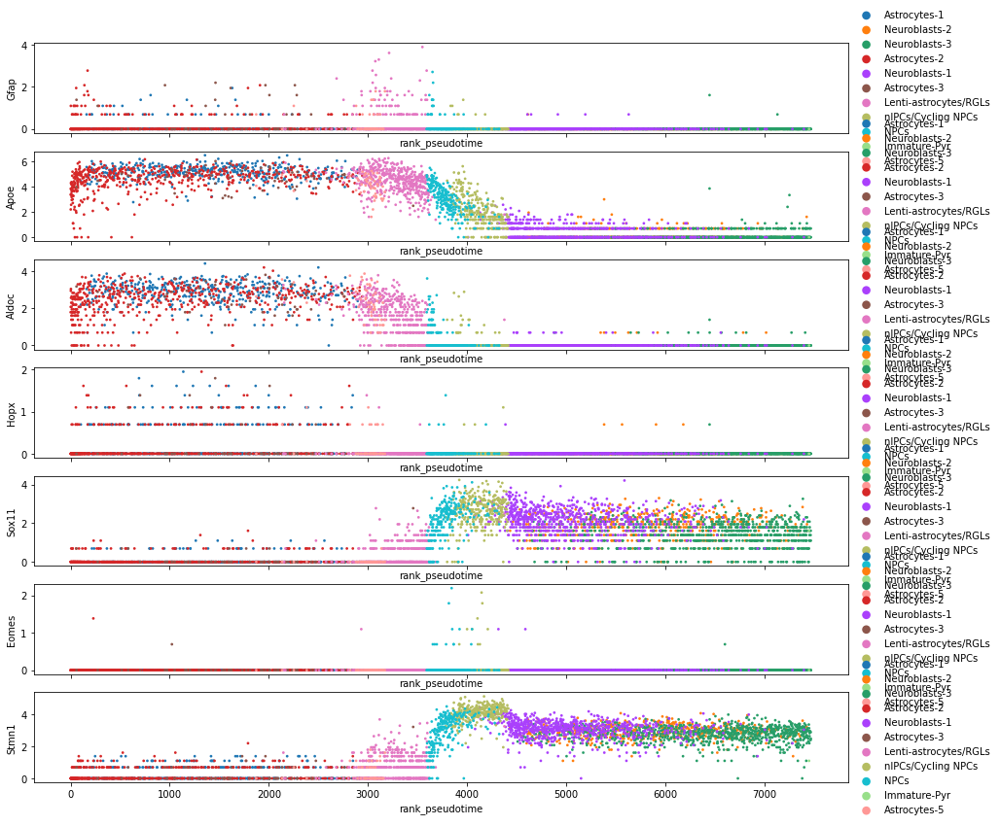

In [31]:
# adata_repr
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_repr, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_ReprAdultNeur_Shin_markers_pseudotime_BL41lOnly.pdf')

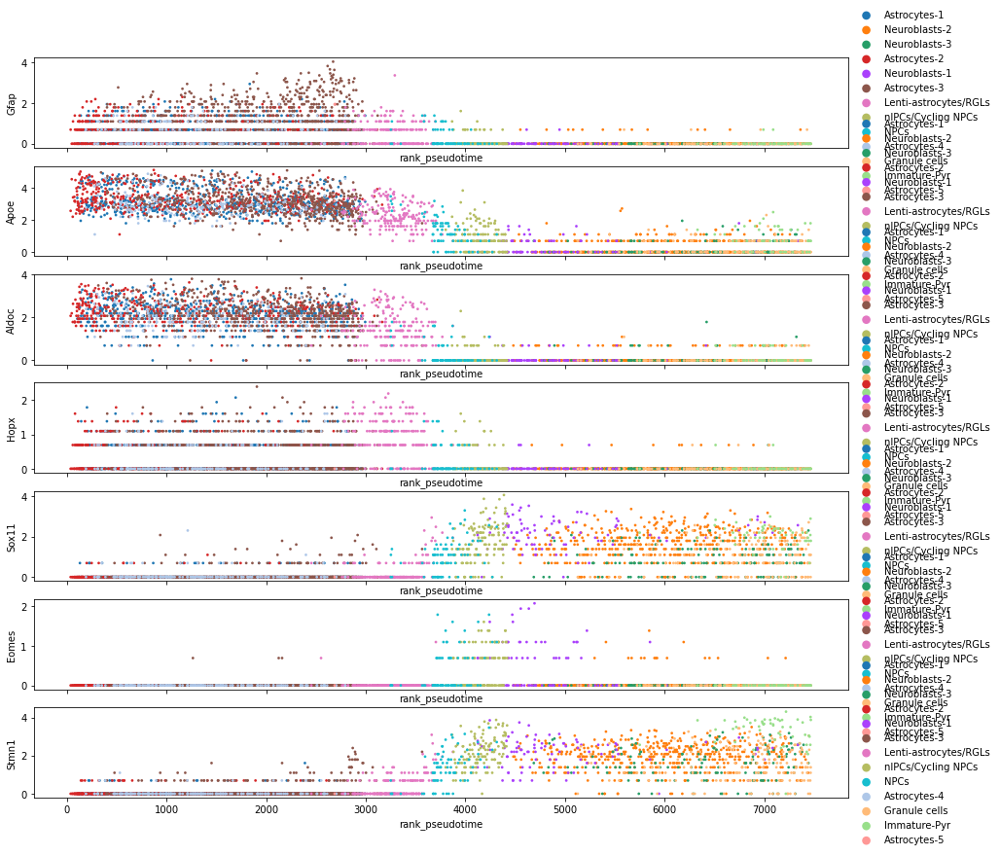

In [32]:
# adata_neur
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_neur, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_ReprAdultNeur_Shin_markers_pseudotime_NeurOnly.pdf')

#### 5.4.3 Markers from Hochgerner et al., 2018

In [139]:
# # From Hochgerner et al. Fig. 2d
# genes_to_plot = ['Aqp4', # Astrocytes
#                  'Aldoc', # Astrocytes and RGL
#                  'Cdk1', 'Mki67', # nIPC
#                  'Eomes', # nIPC and NB1
#                  'Neurod2' # NB2
#                  ]

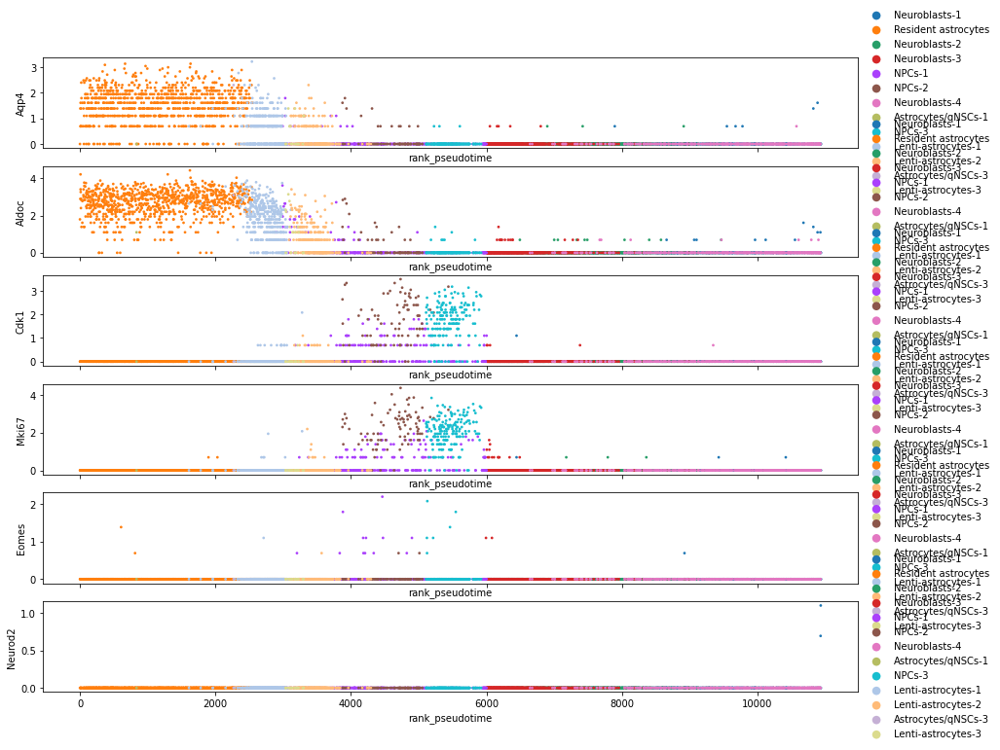

In [229]:
# # Plot these genes in lenti-DLX2 cells
# fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
# for i, gene in enumerate(genes_to_plot):
#     sc.pl.scatter(adata_DLX2, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
#                  title='')
# plt.savefig('./figures/scatter_Hochgerner_fig2_markers_pseudotime_BL41lOnly.pdf')

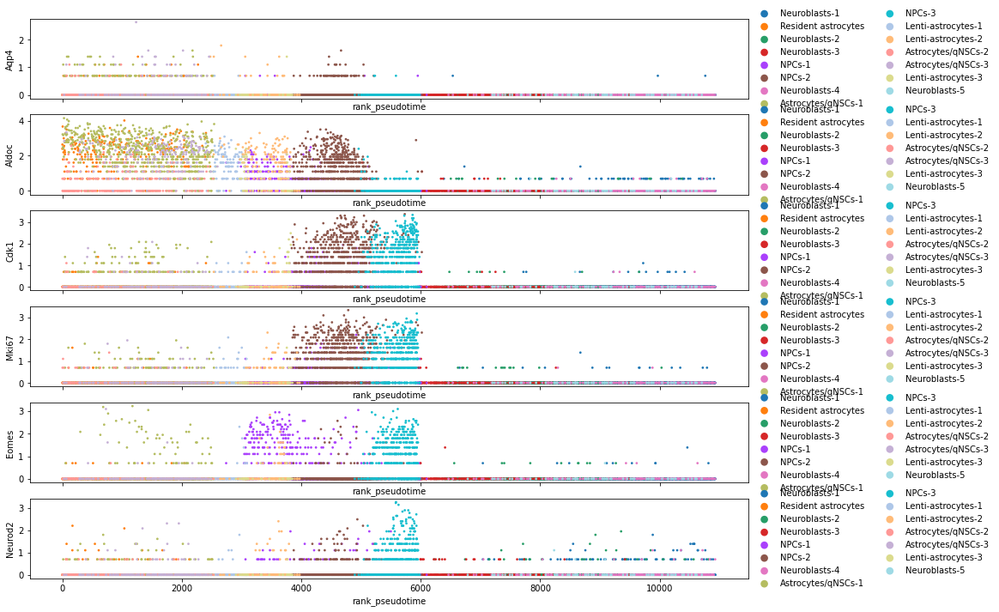

In [230]:
# # Plot these genes in WT E18.5 cells
# fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
# for i, gene in enumerate(genes_to_plot):
#     sc.pl.scatter(adata_10X, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
#                  title='')
# plt.savefig('./figures/scatter_Hochgerner_fig2_markers_pseudotime_10XOnly.pdf')

#### 5.4.4 Other marker genes

In [140]:
genes_to_plot = ['Gfap', 'Ascl1', 'Cdk1', 'Mki67', 'Dcx', 'Calb2']

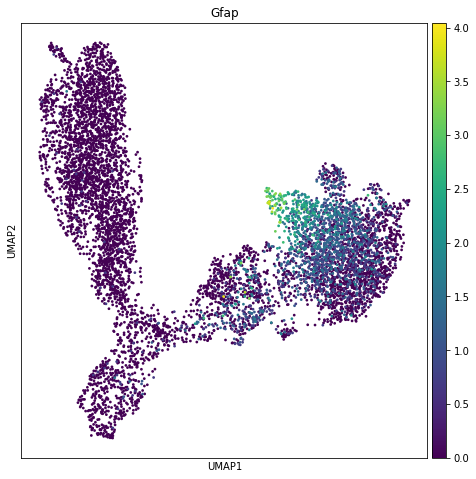

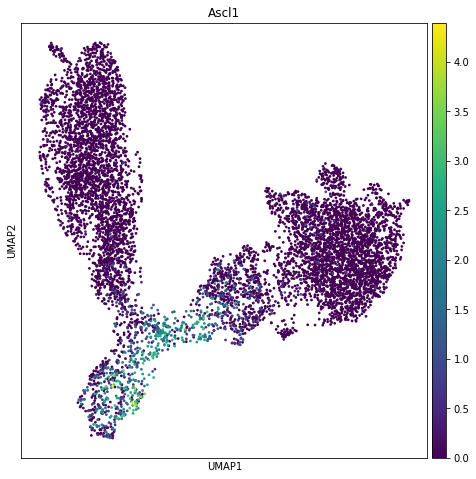

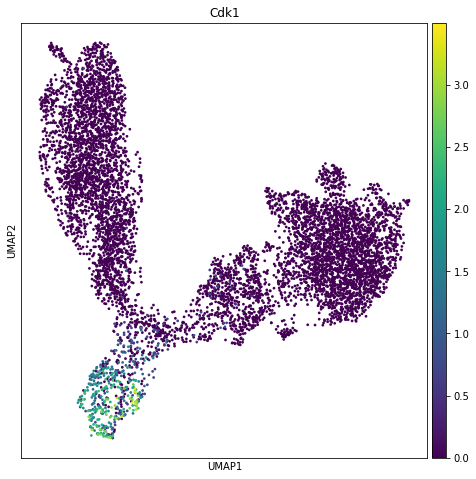

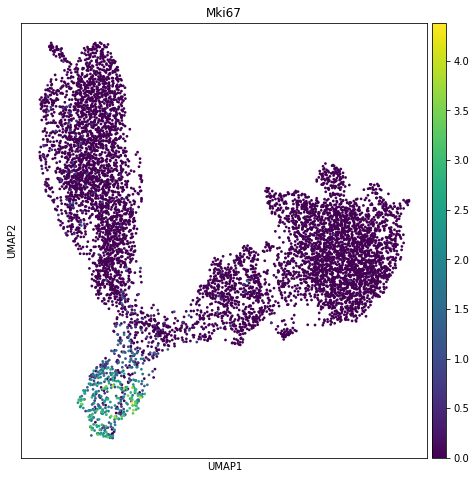

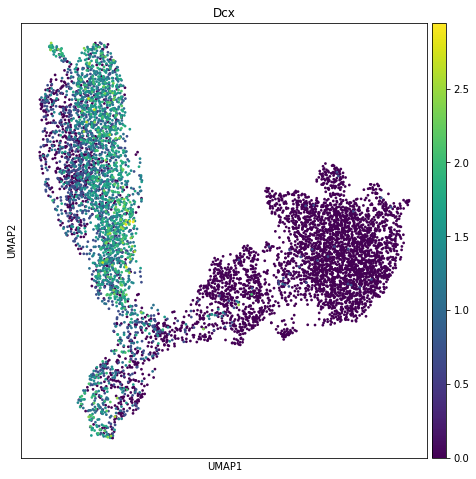

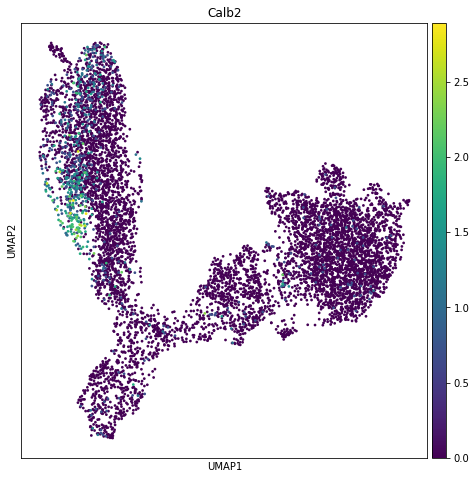

In [141]:
# Figure S3DEFGH
for gene in genes_to_plot:
    sc.pl.umap(adata_neural, color=gene, legend_loc='on data', size=30, use_raw=True, 
              save='_MT_'+gene+'.pdf'
              )

# Misc